In [1]:
require(ISLR)
require(splines)
require(gam)

Loading required package: ISLR
Loading required package: splines
Loading required package: gam
Loading required package: foreach
Loaded gam 1.12



In [2]:
attach(Wage)

In [5]:
fit = lm(wage~poly(age,4), data=Wage)
summary(fit)


Call:
lm(formula = wage ~ poly(age, 4), data = Wage)

Residuals:
    Min      1Q  Median      3Q     Max 
-98.707 -24.626  -4.993  15.217 203.693 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)    111.7036     0.7287 153.283  < 2e-16 ***
poly(age, 4)1  447.0679    39.9148  11.201  < 2e-16 ***
poly(age, 4)2 -478.3158    39.9148 -11.983  < 2e-16 ***
poly(age, 4)3  125.5217    39.9148   3.145  0.00168 ** 
poly(age, 4)4  -77.9112    39.9148  -1.952  0.05104 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 39.91 on 2995 degrees of freedom
Multiple R-squared:  0.08626,	Adjusted R-squared:  0.08504 
F-statistic: 70.69 on 4 and 2995 DF,  p-value: < 2.2e-16


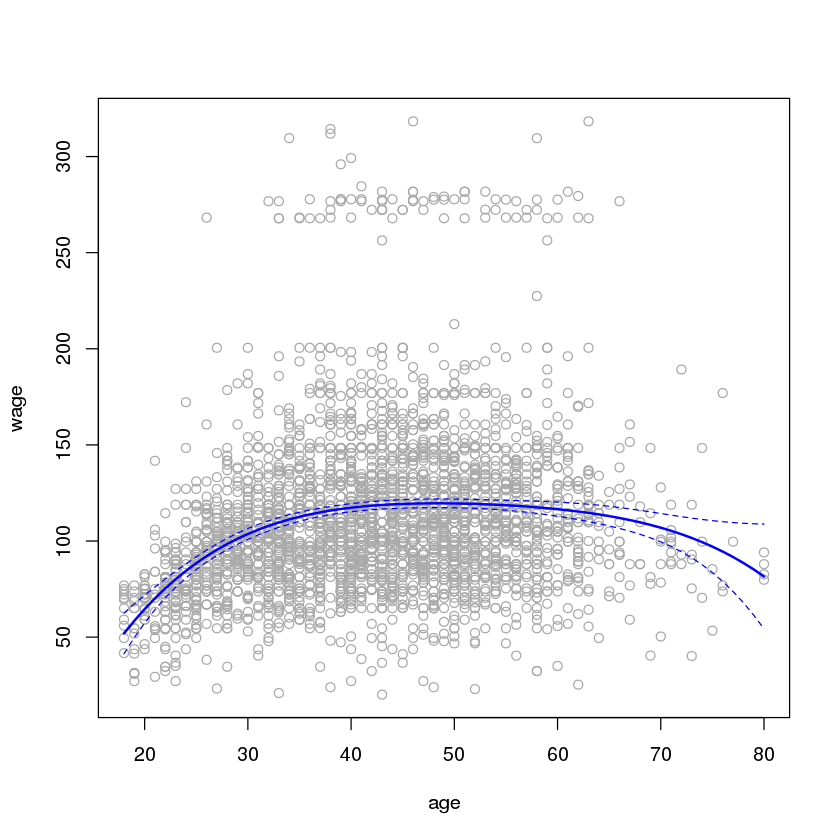

In [8]:
agelims = range(age)
age.grid = seq(from=agelims[1], to=agelims[2])
preds = predict(fit, newdata=list(age=age.grid), se=TRUE)
se.bands = cbind(preds$fit + 2 * preds$se, preds$fit - 2 * preds$se)
plot(age, wage, col = "darkgrey")
lines(age.grid, preds$fit, lwd = 2, col = "blue")
matlines(age.grid, se.bands, col = "blue", lty = 2)

In [9]:
fita = lm(wage ~ age + I(age^2) + I(age^3) + I(age^4), data = Wage)
summary(fita)


Call:
lm(formula = wage ~ age + I(age^2) + I(age^3) + I(age^4), data = Wage)

Residuals:
    Min      1Q  Median      3Q     Max 
-98.707 -24.626  -4.993  15.217 203.693 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.842e+02  6.004e+01  -3.067 0.002180 ** 
age          2.125e+01  5.887e+00   3.609 0.000312 ***
I(age^2)    -5.639e-01  2.061e-01  -2.736 0.006261 ** 
I(age^3)     6.811e-03  3.066e-03   2.221 0.026398 *  
I(age^4)    -3.204e-05  1.641e-05  -1.952 0.051039 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 39.91 on 2995 degrees of freedom
Multiple R-squared:  0.08626,	Adjusted R-squared:  0.08504 
F-statistic: 70.69 on 4 and 2995 DF,  p-value: < 2.2e-16


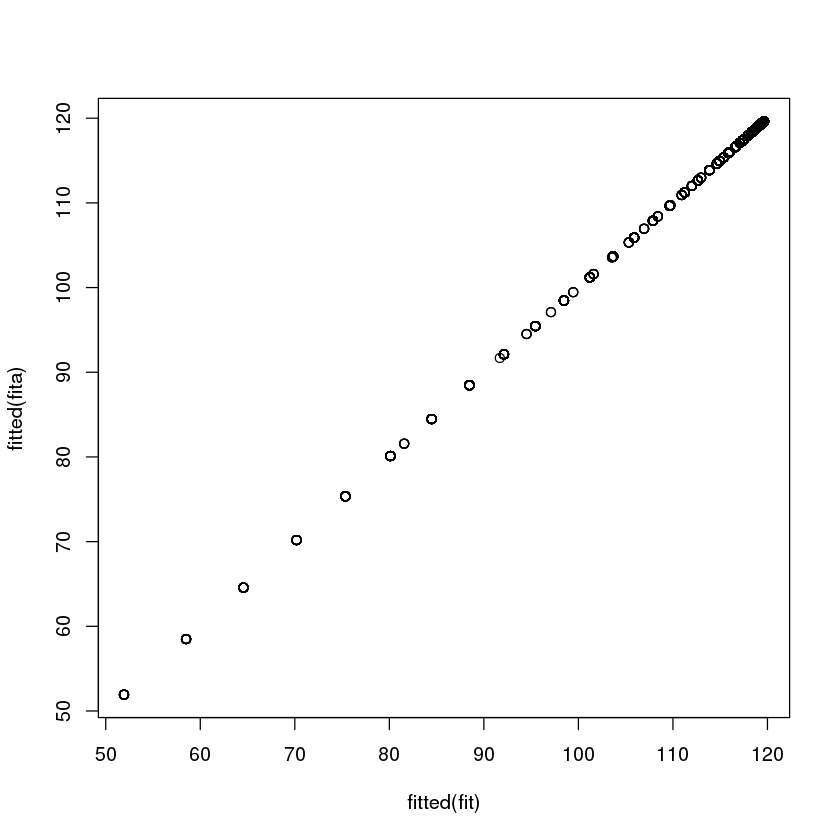

In [10]:
plot(fitted(fit), fitted(fita))

In [11]:
fita = lm(wage ~ education, data = Wage)
fitb = lm(wage ~ education + age, data = Wage)
fitc = lm(wage ~ education + poly(age, 2), data = Wage)
fitd = lm(wage ~ education + poly(age, 3), data = Wage)
anova(fita, fitb, fitc, fitd)

,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
1,2995,3995721,NA,NA,NA,NA
2,2994,3867992,1,127728.9,102.7378,9.215004e-24
3,2993,3725395,1,142597.1,114.6969,2.728971e-26
4,2992,3719809,1,5586.66,4.493588,0.03410431


In [12]:
fit = glm(I(wage > 250) ~ poly(age, 3), data = Wage, family = binomial)
summary(fit)


Call:
glm(formula = I(wage > 250) ~ poly(age, 3), family = binomial, 
    data = Wage)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-0.2808  -0.2736  -0.2487  -0.1758   3.2868  

Coefficients:
              Estimate Std. Error z value Pr(>|z|)    
(Intercept)    -3.8486     0.1597 -24.100  < 2e-16 ***
poly(age, 3)1  37.8846    11.4818   3.300 0.000968 ***
poly(age, 3)2 -29.5129    10.5626  -2.794 0.005205 ** 
poly(age, 3)3   9.7966     8.9990   1.089 0.276317    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 730.53  on 2999  degrees of freedom
Residual deviance: 707.92  on 2996  degrees of freedom
AIC: 715.92

Number of Fisher Scoring iterations: 8


In [13]:
preds = predict(fit, list(age = age.grid), se = T)
se.bands = preds$fit + cbind(fit = 0, lower = -2 * preds$se, upper = 2 * preds$se)
se.bands[1:5, ]

,fit,lower,upper
1,-7.664756,-10.759826,-4.569686
2,-7.324776,-10.106699,-4.542852
3,-7.001732,-9.492821,-4.510643
4,-6.695229,-8.917158,-4.473300
5,-6.404868,-8.378691,-4.431045


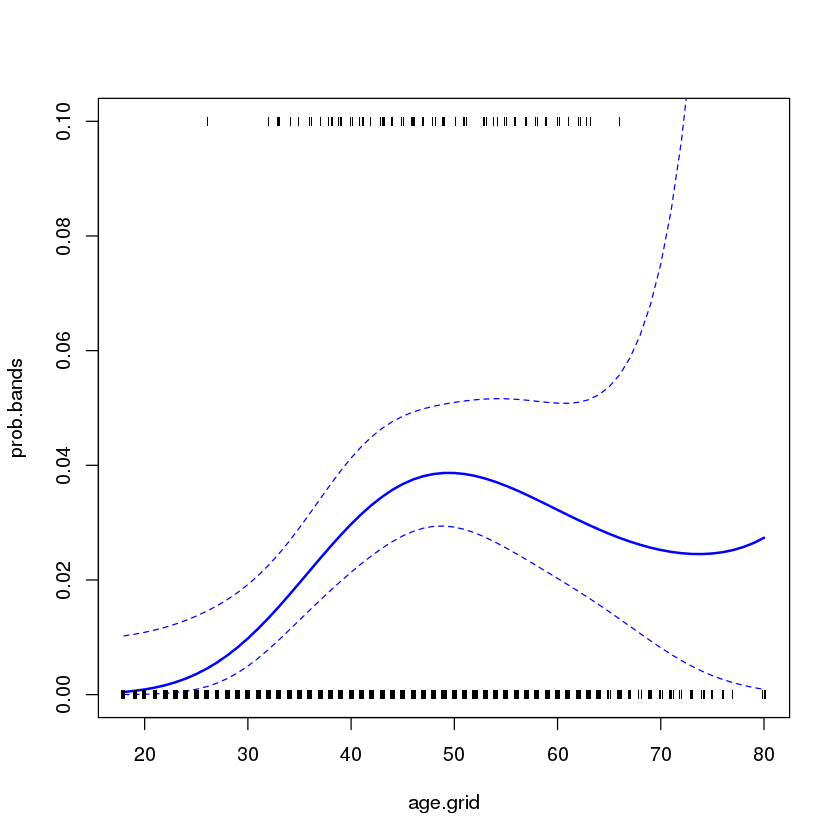

In [14]:
prob.bands = exp(se.bands)/(1 + exp(se.bands))
matplot(age.grid, prob.bands, col = "blue", lwd = c(2, 1, 1), lty = c(1, 2, 
    2), type = "l", ylim = c(0, 0.1))
points(jitter(age), I(wage > 250)/10, pch = "|", cex = 0.5)

Warning message:
In smooth.spline(age, wage, cv = TRUE): cross-validation with non-unique 'x' values seems doubtful

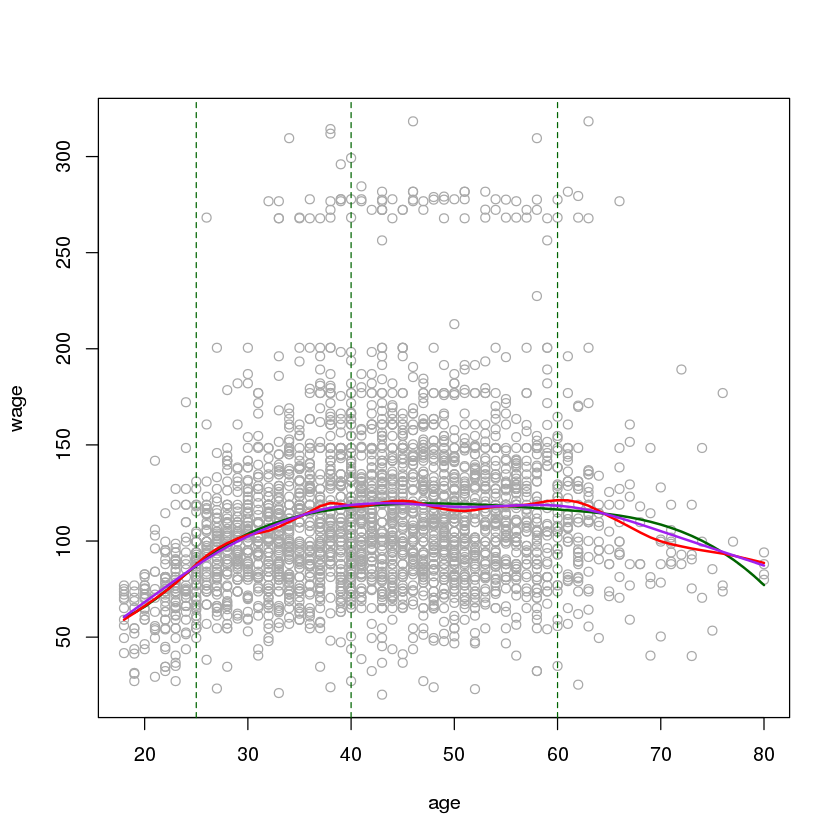

In [17]:
 fit = lm(wage ~ bs(age, knots = c(25, 40, 60)), data = Wage)
 plot(age, wage, col = "darkgrey")
 lines(age.grid, predict(fit, list(age = age.grid)), col = "darkgreen", lwd = 2)
 abline(v = c(25, 40, 60), lty = 2, col = "darkgreen")

#
fit = smooth.spline(age, wage, df = 16)
lines(fit, col = "red", lwd = 2)

fit = smooth.spline(age, wage, cv = TRUE)
lines(fit, col = "purple", lwd = 2)

In [18]:
fit

Call:
smooth.spline(x = age, y = wage, cv = TRUE)

Smoothing Parameter  spar= 0.6988943  lambda= 0.02792303 (12 iterations)
Equivalent Degrees of Freedom (Df): 6.794596
Penalized Criterion: 75215.9
PRESS: 1593.383

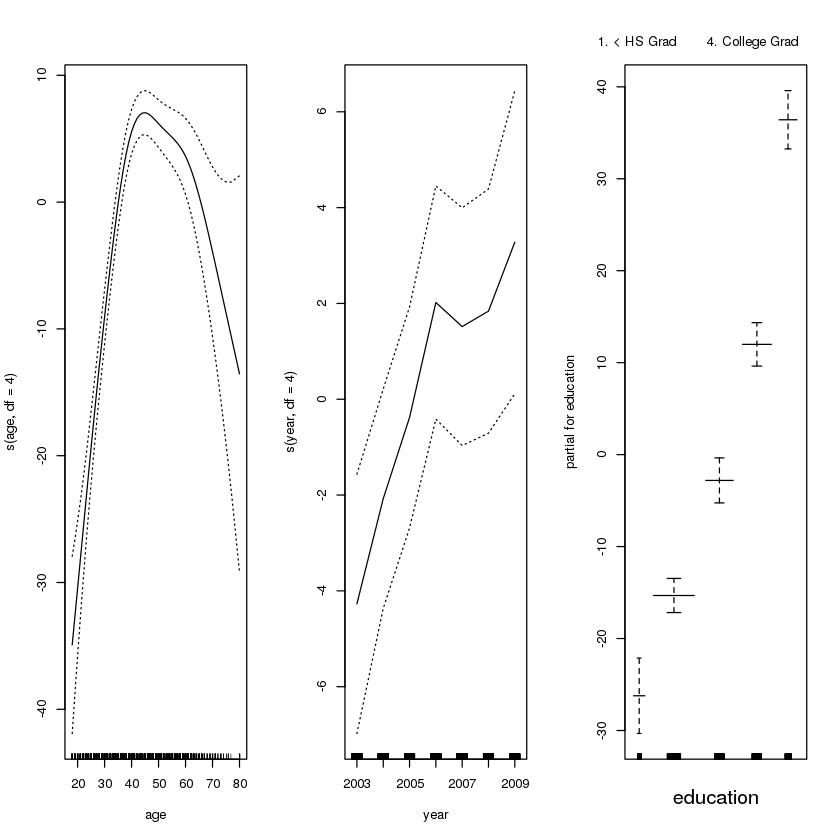

In [19]:
gam1 = gam(wage ~ s(age, df = 4) + s(year, df = 4) + education, data = Wage)
par(mfrow = c(1, 3))
plot(gam1, se = T)

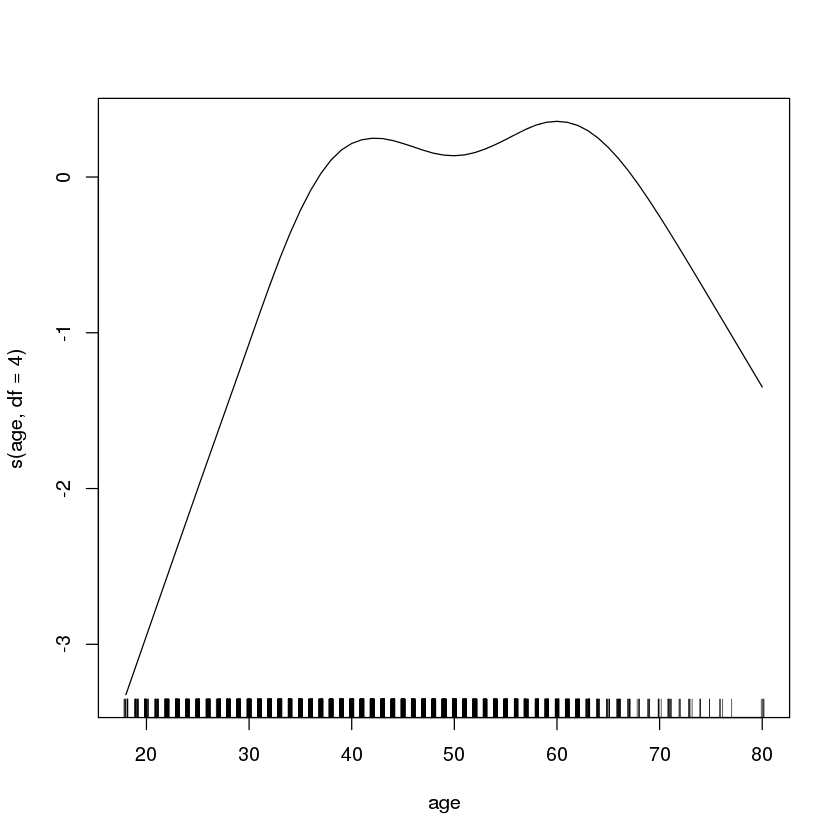

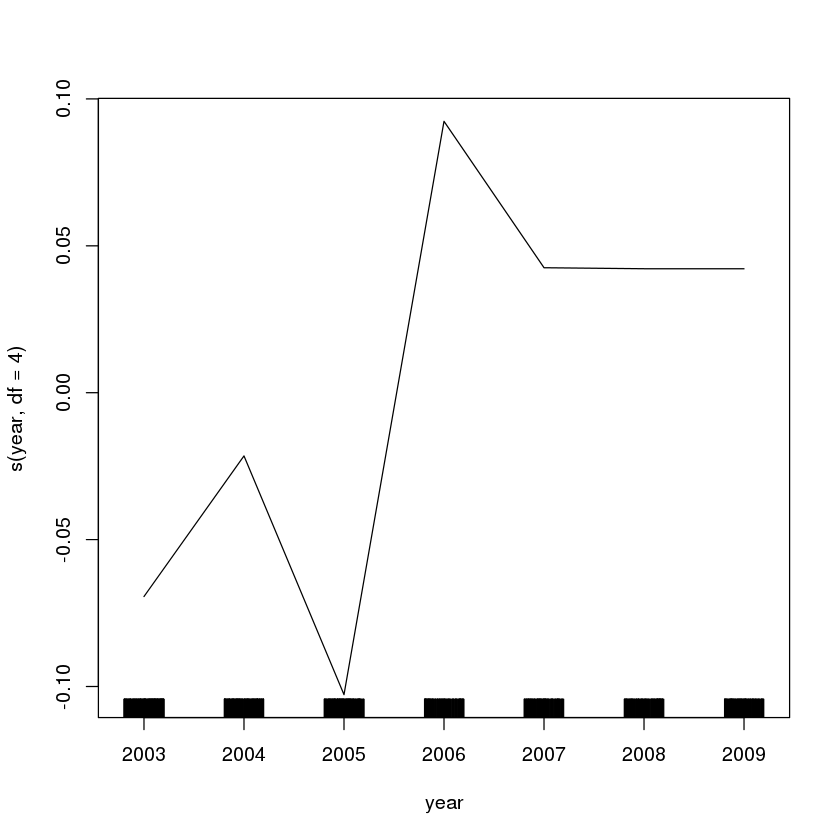

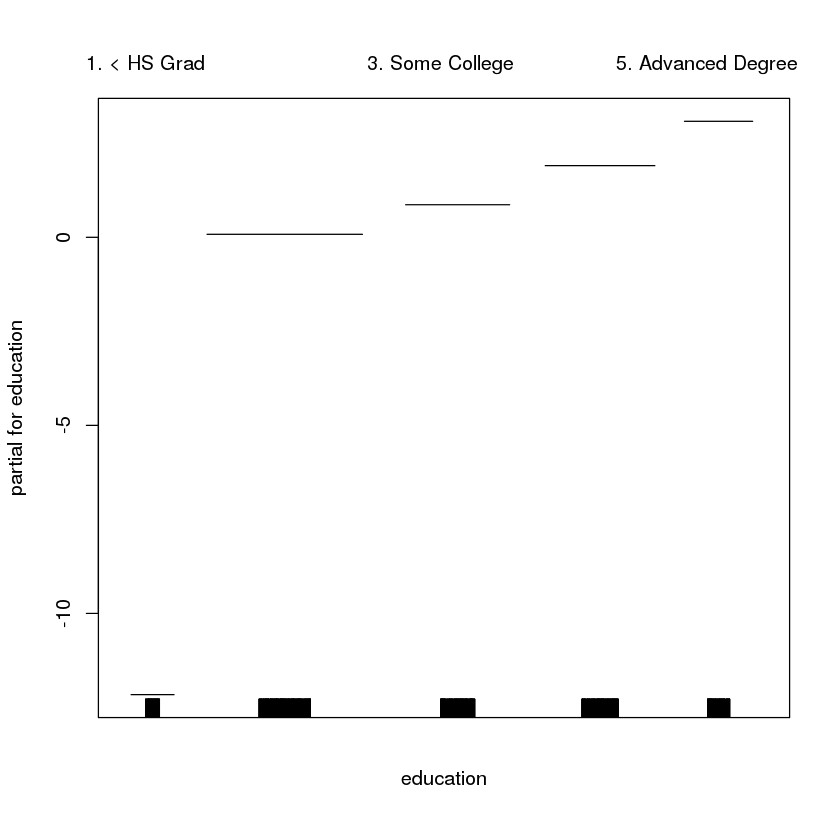

In [20]:
gam2 = gam(I(wage > 250) ~ s(age, df = 4) + s(year, df = 4) + education, data = Wage, family = binomial)
plot(gam2)

In [21]:
gam2a = gam(I(wage > 250) ~ s(age, df = 4) + year + education, data = Wage, family = binomial)
anova(gam2a, gam2, test = "Chisq")

,Resid. Df,Resid. Dev,Df,Deviance,Pr(>Chi)
1,2990,603.7774,NA,NA,NA
2,2987,602.8725,2.999983,0.9049826,0.8242229


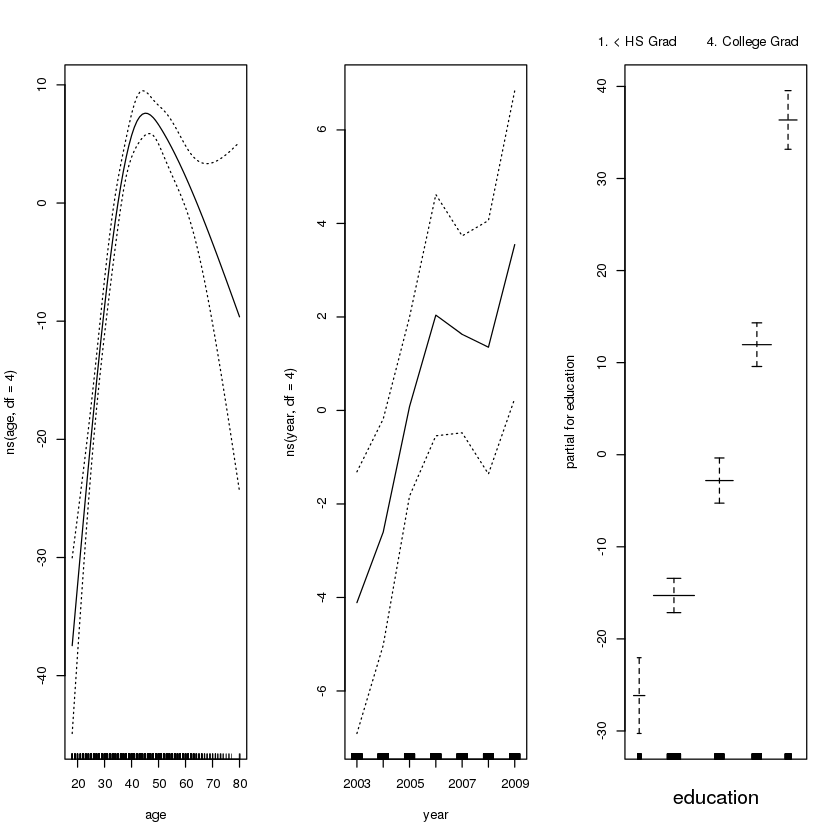

In [22]:
par(mfrow = c(1, 3))
lm1 = lm(wage ~ ns(age, df = 4) + ns(year, df = 4) + education, data = Wage)
plot.gam(lm1, se = T)

In [23]:
load('../Data/7.R.RData')

In [25]:
lmfit = lm(y~x)
summary(lmfit)


Call:
lm(formula = y ~ x)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.71289 -0.26943 -0.02448  0.21068  0.83582 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 95.43627    7.14200   13.36   <2e-16 ***
x           -0.67483    0.05073  -13.30   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3376 on 98 degrees of freedom
Multiple R-squared:  0.6436,	Adjusted R-squared:   0.64 
F-statistic:   177 on 1 and 98 DF,  p-value: < 2.2e-16


In [26]:
lmfit2 = lm(y~x+I(x^2))
summary(lmfit2)


Call:
lm(formula = y ~ x + I(x^2))

Residuals:
     Min       1Q   Median       3Q      Max 
-0.65698 -0.18190 -0.01938  0.16355  0.86149 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -5.421e+03  1.547e+03  -3.505 0.000692 ***
x            7.771e+01  2.197e+01   3.536 0.000624 ***
I(x^2)      -2.784e-01  7.805e-02  -3.567 0.000563 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3191 on 97 degrees of freedom
Multiple R-squared:  0.6849,	Adjusted R-squared:  0.6784 
F-statistic: 105.4 on 2 and 97 DF,  p-value: < 2.2e-16
